<div align="center"><h1> 
An inspection of restaurants in NYC
</h1></div>

<div align="left"><h2 style="color:DodgerBlue;"> Data Exploration</h2></div>

In [1]:
# install folium using pip install folium 

In [17]:
#Importing all the libraries
import pandas as pd
import datetime
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import LabelBinarizer,LabelEncoder
import folium
from folium import plugins
import time

In [5]:
import urllib3
url1 = "https://drive.google.com/uc?export=download&id=1tU5T3-CvhmC9rafL5NMBAmmBQ5fpxef0"
url2 = "https://drive.google.com/uc?export=download&id=1pRXZI-hPO6KNEWp--M8gqNZsMf5Dm4Te"

http = urllib3.PoolManager()
response = http.request('GET', url2)
response1 = http.request('GET', url1)

#open the file for writing
fh = open('NYC restaurants.csv.zip', "wb")

# read from request while writing to file
fh.write(response.data)
fh.close()
fh = open('Zip codes and Lat_Long.csv.zip',"wb")
fh.write(response1.data)
fh.close()


C:\Users\vaibh\Anaconda3\lib\site-packages\urllib3\connectionpool.py:858: InsecureRequestWarning: Unverified HTTPS request is being made. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  InsecureRequestWarning)
C:\Users\vaibh\Anaconda3\lib\site-packages\urllib3\connectionpool.py:858: InsecureRequestWarning: Unverified HTTPS request is being made. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  InsecureRequestWarning)
C:\Users\vaibh\Anaconda3\lib\site-packages\urllib3\connectionpool.py:858: InsecureRequestWarning: Unverified HTTPS request is being made. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  InsecureRequestWarning)
C:\Users\vaibh\Anaconda3\lib\site-packages\urllib3\connectionpool.py:858: InsecureRequestWarning: Unverified HTT

In [6]:
import zipfile
zip_ref = zipfile.ZipFile('NYC restaurants.csv.zip', 'r')
zip_ref.extractall()
zip_ref.close()

zip_ref1 = zipfile.ZipFile('Zip codes and Lat_Long.csv.zip', 'r')
zip_ref1.extractall()
zip_ref1.close()

In [7]:
#Reading the initial dataset
filepath1 = "NYC restaurants.csv" ## USER INPUT 
filepath2 = "Zip codes and Lat_Long.csv" ## USER INPUT 
df_initial = pd.read_csv(filepath1,index_col=False)
print (df_initial.count())
zips = pd.read_csv(filepath2,index_col=False)
#df.head()

camis                    374697
dba                      373998
boro                     374697
building                 374516
street                   374694
zipcode                  374694
phone                    374695
cuisine_description      374697
inspection_date          374697
action                   373267
violation_code           368413
violation_description    366959
critical_flag            374697
score                    354725
grade                    188497
grade_date               186731
record_date              374697
inspection_type          373267
dtype: int64


In [8]:
#Changing the format of the date fields
df_initial.inspection_date.dtypes
df_initial['inspection_date'] =  pd.to_datetime(df_initial['inspection_date'], format='%Y-%m-%dT00:00:00+00:00')
df_initial['grade_date'] =  pd.to_datetime(df_initial['grade_date'], format='%Y-%m-%dT00:00:00+00:00')

In [25]:
#Merging the ZipCodes with the Longitudes and Latitudes 
ZipLong=df_initial.merge(zips, left_on='zipcode', right_on = 'ZIP', how= 'left') #Merging LNG and LAT information with our dataset

def convertToFloat(x):     #Function to convert LNG and LAT values to floating point values
    try:
        x = float(x)
    except Exception:
        x = None
    return x
 
ZipLong["LNG"] = ZipLong["LNG"].apply(convertToFloat)
ZipLong["LAT"] = ZipLong["LAT"].apply(convertToFloat)
 
ZipLong=ZipLong.dropna(axis=0,how='any') #Droping rows containing no LNG and LAT values
ZipLong = ZipLong.sort_values(by = 'inspection_date')
ZipLong=ZipLong.drop_duplicates(subset='camis', keep="last")

# Removing duplicate records 

In [10]:
#Checking for duplicates in the data - removed 110 duplicate rows 
#Initial rows - 
#Final Row Count - 374587
df_1 = df_initial.drop_duplicates(keep= 'first')
print("Initial rows: ",df_initial['camis'].count())
print("Final rows: ",df_1['camis'].count())
print("Rows removed: ",df_initial['camis'].count() - df_1['camis'].count())

Initial rows:  374697
Final rows:  374587
Rows removed:  110


# Frequency Distribution

In [11]:
#Finding frequency distribution of the each column 
#1. Most of the relevant columns have 0% missing values which we can include in our model except a few like grade, 
#   violation, score
#2. If we will include grade, violation code in our final model we will have to remove the rows with the missing values 
#   in the final dataset
#3. We can do missing value computations for the score column
#4. As the number of missing value in grade is very high, hence we are deciding not to perform any missing value computation

total = df_1.isnull().sum().sort_values(ascending = False)
percent = (df_1.isnull().sum()/df_1.isnull().count()*100).sort_values(ascending = False)
data_missing  = pd.concat([total, percent], axis=1, keys=['Total', 'Percent'])
data_missing

,Total,Percent
grade_date,187856,50.150165
grade,186092,49.679247
score,19862,5.302373
violation_description,7629,2.036643
violation_code,6284,1.677581
inspection_type,1430,0.381754
action,1430,0.381754
dba,699,0.186606
building,181,0.048320
street,3,0.000801


<div align="left"><h2 style="color:DodgerBlue;"> Data Analysis</h2></div>

<div align="left"><ul><h3 style="color:DodgerBlue;"> Performing univariate analysis on relevant columns:</h3></ul></div>

In [10]:
#Column Chosen: Boro(Borough) 
#We can check in the frequency distribution of the inspections,there are few missing boroughts in the data
#1. Staten Island has the lowest number of inspections done in comparison to Manhatten which has the highest
#2. There are 49 missing boroughs in the records 
pd.DataFrame(df_1.boro.value_counts(ascending=False))

,boro
MANHATTAN,148663
BROOKLYN,95461
QUEENS,83956
BRONX,33505
STATEN ISLAND,12953
Missing,49


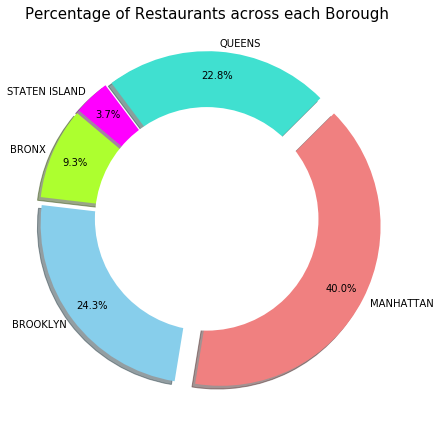

In [11]:
############ Donut plot of Percentage of unique restaurants in each borough
# 40% of the restaurants are present in Manhatten whereas Staten Island has the least % of restaurants 
Donut=ZipLong.groupby("boro",as_index=False).count()
Donut=Donut.drop(Donut.index[3]) #Dropping 'missing' row which has a count of just 1.
 
########## 
fig = plt.figure(figsize=[6,6]) #Enlarging the pie chart for easy viewing
ax = fig.add_subplot(111)
explode=(0.05,0.05,0.1,0.05,0.05)
colors=['greenyellow','skyblue','lightcoral','turquoise','fuchsia']
ax.axis('equal')
plotpie=plt.pie(Donut['camis'],colors=colors,explode=explode,pctdistance=0.85,labels=Donut.boro,shadow=True,autopct='%1.1f%%',startangle=140,labeldistance=1.05)
centre_circle = plt.Circle((0,0),0.70,fc='white')
fig = plt.gcf()
fig.gca().add_artist(centre_circle)
ax.set_title("Percentage of Restaurants across each Borough",fontsize=15);
plt.tight_layout()
plt.show()
 

In [12]:
#Column Chosen: Grades 
#1. There are few restaurants that have not been graded with most of the restaurants as high rated 
#2. Initially from the frequency chart, we analyzed 49.6% of the restaurant have missing grades which are different from 
# not yet graded 
pd.DataFrame(df_1.grade.value_counts(ascending=False))

,grade
A,149263
B,23235
C,6363
Z,5938
P,1930
Not Yet Graded,1766


In [13]:
#Column Chosen: Cuisine 
#1.Most of the inspections have been done in american restaurant which is more than 50% more than the second category. This 
# was expected as we have data for NYC city
print("Top 7:\n",pd.DataFrame(df_1.cuisine_description.value_counts(ascending=False)).head(7))
print("-------------------------------------------------------------------------")
print("Bottom 7:\n",pd.DataFrame(df_1.cuisine_description.value_counts(ascending=False)).tail(7))

Top 7:
                                                     cuisine_description
American                                                          82728
Chinese                                                           38861
Latin (Cuban, Dominican, Puerto Rican, South & ...                17019
CafÃ©/Coffee/Tea                                                  16614
Pizza                                                             16608
Italian                                                           15859
Mexican                                                           14796
-------------------------------------------------------------------------
Bottom 7:
                     cuisine_description
Iranian                              44
Polynesian                           43
Nuts/Confectionary                   40
Soups                                39
Czech                                33
Chilean                              17
Basque                                5


In [14]:
#1. There are very few categories where violations were not recorded and most of the inspections had citations 
pd.DataFrame(df_1.action.value_counts(ascending=False))

,action
Violations were cited in the following area(s).,352573
Establishment Closed by DOHMH. Violations were cited in the following area(s) and those requiring immediate action were addressed.,11192
No violations were recorded at the time of this inspection.,4804
Establishment re-opened by DOHMH,3275
Establishment re-closed by DOHMH,1313


In [15]:
##Column Chose: Cuisine 
#More number of inspections led to criticalicaly which means that the restaurant has increased food safety risk to customers
pd.DataFrame(df_1.critical_flag.value_counts())

,critical_flag
Critical,205104
Not Critical,161854
Not Applicable,7629


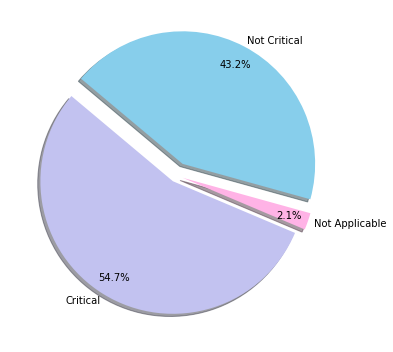

In [16]:
######### Percentage of Critical/Non-Critical Violations across NYC
Crit_NonCrit_Violations=df_initial.groupby('critical_flag',as_index=False).count()
 
fig = plt.figure(figsize=[5,5]) 
explode=[0.05,0.05,0.1]
 
colors = ['#c2c2f0','#ffb3e6', 'skyblue']
plt.pie(Crit_NonCrit_Violations['camis'],colors=colors,explode=explode,pctdistance=0.85,labels=Crit_NonCrit_Violations.critical_flag,shadow=True,autopct='%1.1f%%',startangle=140,labeldistance=1.05)
 
#df_initial["critical_flag"].value_counts().plot.pie(figsize=(8,8),colors=colors)
plt.gca().set_aspect("equal")
ax.set_title("Percentage of Critical/Non-Critical Violations across NYC",fontsize=15);
plt.tight_layout()
plt.show()

In [17]:
##Column Chosen: Score
#We can see as 99% of the data is within the score of 68  
#While computing the model, we can consider them as outliers and remove the rows with score <0
pd.DataFrame(df_1.score.describe(percentiles =[0.25,0.50,0.75,0.99]))

,score
count,354725.000000
mean,19.211913
std,13.537504
min,-2.000000
25%,11.000000
50%,14.000000
75%,24.000000
99%,68.000000
max,178.000000


Text(0.5,1,'Boxplot by Score')

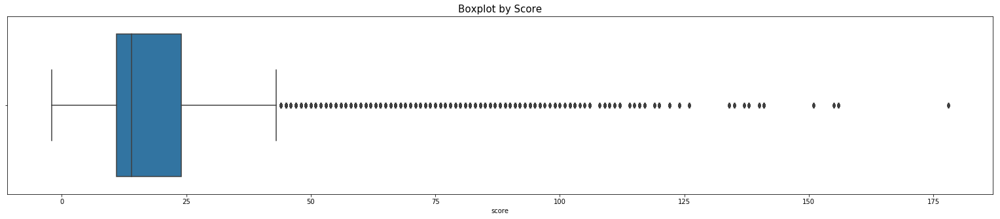

In [18]:
# Trying to find if there are any values in the outlier - in the final model we further need to analyse if to take all scores 
# which we can find on basis of bi-variate analysis based on other columns 
fig, ax = plt.subplots()
fig.set_size_inches(27, 5)
sns.boxplot(df_1.score.dropna())
plt.title('Boxplot by Score', fontsize = 15)

In [19]:
#Column Chosen: Inspection Type
print("Top 7:\n",pd.DataFrame(df_1.inspection_type.value_counts(ascending=False)).head(7))
print("-------------------------------------------------------------------------")
print("Bottom 7:\n",pd.DataFrame(df_1.inspection_type.value_counts(ascending=False)).tail(7))

Top 7:
                                                    inspection_type
Cycle Inspection / Initial Inspection                       216147
Cycle Inspection / Re-inspection                             91720
Pre-permit (Operational) / Initial Inspection                24209
Pre-permit (Operational) / Re-inspection                     10839
Administrative Miscellaneous / Initial Inspection             7105
Cycle Inspection / Reopening Inspection                       3993
Pre-permit (Non-operational) / Initial Inspection             3690
-------------------------------------------------------------------------
Bottom 7:
                                                     inspection_type
Trans Fat / Second Compliance Inspection                         15
Calorie Posting / Compliance Inspection                          12
Smoke-Free Air Act / Limited Inspection                           2
Smoke-Free Air Act / Second Compliance Inspection                 2
Inter-Agency Task Force / Re-in

# Performing bivariate analysis

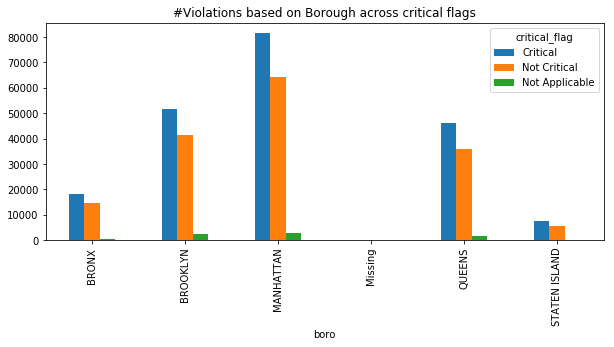

In [20]:
#From here we can deduce that most of the restaurants 
boro_criticality = pd.crosstab(df_1.boro, df_1.critical_flag)
boro_criticality = boro_criticality[['Critical', 'Not Critical','Not Applicable']]
boro_criticality.plot(kind="bar", figsize=(10,4), title='#Violations based on Borough across critical flags',stacked=False)


In [21]:
# Performing bi-variate of Scores with other variables 

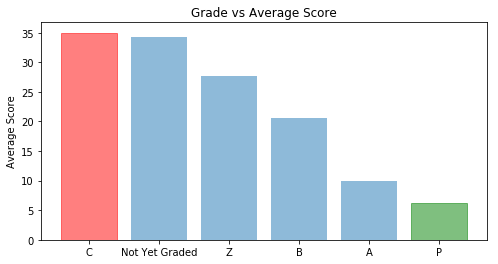

In [22]:
#Different grades have different average scores and this was expected as A is the best and C the worst grade for the rating 
#C is therefore having the highest average score among this 
#There are few restaurants which have been not been graded
Grade_Score=df_1.groupby('grade',as_index=False).mean()
Grade_Score=Grade_Score.sort_values('score',ascending=False)
Grade_Score
fig = plt.figure(figsize=(8,4))
barlist=plt.bar(Grade_Score['grade'], Grade_Score['score'], align='center', alpha=0.5)
barlist[0].set_color('r')
barlist[5].set_color('g')
plt.ylabel('Average Score')
plt.title('Grade vs Average Score')
plt.show()


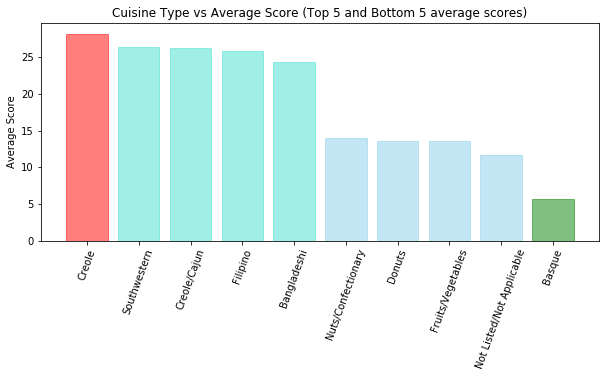

In [23]:
#Different cuisine types have different average scores and we can make an assumption that cuisine type is one of the variables
#that can be used in the regression model. Top 5 have different grades than the bottom 5 except for highest and lowest values
#1.Creole marked in red has the highest average score among all cusines 
#2.Basque marked in green has the lowest average score among all cusines
Cusine_Score=df_1.groupby('cuisine_description',as_index=False).mean()
Cusine_Score=Cusine_Score.sort_values('score',ascending=False)
Cusine_Score_1=Cusine_Score.head(5)
Cusine_Score_2=Cusine_Score_1.append(Cusine_Score.tail(5))

fig = plt.figure(figsize=(10,4))
barlist=plt.bar(Cusine_Score_2['cuisine_description'], Cusine_Score_2['score'], align='center', alpha=0.5)
plt.xticks(Cusine_Score_2['cuisine_description'],rotation=70)
barlist[0].set_color('r')
for i in range(1,5):
    barlist[i].set_color('turquoise')
for i in range(5,10):
    barlist[i].set_color('skyblue')
barlist[9].set_color('g')
plt.ylabel('Average Score')
plt.title('Cuisine Type vs Average Score (Top 5 and Bottom 5 average scores)')
plt.show()


<div align="left"><h2 style="color:DodgerBlue;"> Data Cleaning</h2></div>

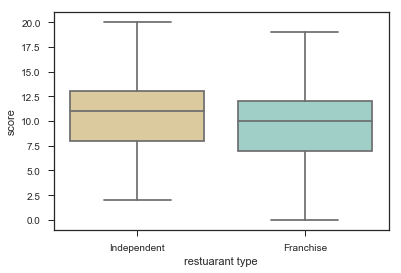

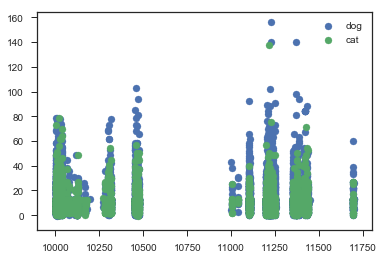

In [24]:
#Removing the dates with Year=1900 as from the codebook, this is a dummy value for rows where the inspection has not be done 
df = pd.DataFrame(df_1.drop(df_1[df_1['inspection_date'].dt.year==1900].index))

df['score'].replace('', np.nan, inplace=True)
df.dropna(subset=['score'], inplace=True)

#df['inspection_date'].dt.year==1900
#print df.sort_values(by = 'inspection_date')
#print df1[df1['inspection_date'].dt.year==1900]
#print df["inspection_date"].dt.month.value_counts()

#df.violation_code.groupby(df['cuisine_description']).value_counts()

sns.set(style="ticks", color_codes=True)


#print df.violation_code.value_counts()
df_final = df.sort_values(by = 'inspection_date')
df_final = df_final.drop_duplicates(subset='camis', keep="last")
df_b = df_final.groupby(["boro"]).size().reset_index(name="freq")
df_b = pd.DataFrame(df_b.sort_values('freq',ascending=False))

df_franch = df_final[df_final.duplicated(subset='dba', keep=False) == True]
df_indep = df_final[df_final.duplicated(subset='dba', keep=False) == False]

#df_franch.to_csv("franchise.csv")

#df_indep.to_csv("independent.csv")



df_final['res_type'] = df_final.duplicated(subset='dba', keep=False)
df_final.loc[df_final['res_type'] == True, 'restuarant type'] = "Franchise"

df_final.loc[df_final['res_type'] == False, 'restuarant type'] = "Independent"

#print df_final.head()
            
                

#df_franch.boxplot(column='score')
ax = sns.boxplot(x=df_final["restuarant type"],y = df_final["score"],showfliers=False,palette="BrBG")
#sns.plt.show()

fig = ax.get_figure()
fig.savefig("output.png")

#print df_franch.describe()
list1 = df_franch['zipcode'].tolist()
list2 = df_indep['zipcode'].tolist()
fig, ax = plt.subplots()
ax.scatter(list2, df_indep["score"], label="dog")
ax.scatter(list1, df_franch["score"], label="cat")
ax.legend()

plt.show()
#plt.scatter(x=df_indep["zipcode"], y=df_indep["score"])
#sns.plt.show()
new_df = pd.DataFrame()
new_df['zip'] = df_indep.zipcode
new_df['fscore'] = df_franch.score
new_df['iscore'] = df_indep.score

#print new_df


df_c = df_final.groupby(["cuisine_description","score"]).size().reset_index(name="freq")
df_c = pd.DataFrame(df_c.sort_values('freq',ascending=False))
df_c.to_csv("abc1.csv")


df_v = df.groupby(["violation_code", "violation_description"]).size().reset_index(name="freq")
a = df_v.freq.sum()
df_v['perc'] = df_v.freq/a
df_v = pd.DataFrame(df_v.sort_values('freq',ascending=False))
df_v= df_v.head(10)
#print df_v
#sns.barplot(df_v.violation_code, df_v.freq)
#plt.show()

df_v3 = df.groupby(["violation_code", "violation_description", "boro"]).size().reset_index(name="freq")
df_v3 = pd.DataFrame(df_v3.sort_values('freq',ascending=False))
#print df_v3
#df.violation_code.groupby(df['cuisine_description']).first()

df_v1 = df.groupby([ "cuisine_description","violation_code", "violation_description"]).size().reset_index(name="freq")
b = a = df_v1.freq.sum()
#print df_v1.sort_values('freq',ascending=False)

#print df_franch.describe()
#print df_indep.describe()

<div align="left"><h2 style="color:DodgerBlue;"> Data Visualization</h2></div>

<h2> Heatmap </h2>

In [25]:
###### Plotting folium map of unique restaurants

lng_info=[] #Initialising empty list to store latitude information

lat_info=[] #Initialising empty list to store longitude information

N = len(ZipLong) #Count of restaurant details which will be entered in the empty lists defined above

for i in range(N):

    lat_info.append(ZipLong["LAT"].iloc[i])

    lng_info.append(ZipLong["LNG"].iloc[i])


###### Plotting folium map of unique restaurants

data = np.array([lat_info, lng_info, range(N),]).T

resto_map = folium.Map([40.767937,-73.982155], zoom_start=5)

plugins.MarkerCluster(data).add_to(resto_map)

resto_map



 

In [26]:
######### Plotting folium map of A - Grade restaurants

agrade_heatmap = folium.Map(location=[40.761635, -73.971802], zoom_start=12)

agrade_heatmap.add_child(plugins.HeatMap([[row["LAT"], row["LNG"]] for name, row in ZipLong[ZipLong["grade"]=='A'].iloc[:].iterrows()]))

folium.Marker([40.7587 ,-73.9813],

              popup='47-50th Rockfeller Street',

              icon=folium.Icon(color='green')

             ).add_to(agrade_heatmap)

folium.CircleMarker([40.7587 ,-73.9813],

                    radius=50,

                    popup='Manhattan',

                    color='black',

                    ).add_to(agrade_heatmap)

agrade_heatmap




In [27]:
####### Plotting folium map of P - Grade restaurants

pgrade_heatmap = folium.Map(location=[40.761635, -73.971802], zoom_start=12)

pgrade_heatmap.add_child(plugins.HeatMap([[row["LAT"], row["LNG"]] for name, row in ZipLong[ZipLong["grade"]=='P'].iloc[:].iterrows()]))

folium.Marker([40.774425 ,-73.956997],

              popup='East 79 Street',

              icon=folium.Icon(color='green')

             ).add_to(pgrade_heatmap)

folium.CircleMarker([40.774425 ,-73.956997],

                    radius=50,

                    popup='Manhattan',

                    color='black',

                    ).add_to(pgrade_heatmap)

pgrade_heatmap

In [28]:
######### Plotting folium map of Latest Scores vs Zipcodes

df2=ZipLong.groupby('zipcode').mean()

score_heatmap = folium.Map(location=[40.761635, -73.971802], zoom_start=12)

for name,row in df2.iterrows():

    radius=((row["score"]-10)*4)

    folium.CircleMarker([row["LAT"], row["LNG"]],

                    radius=radius,

                    popup=str([int(row['ZIP'])]),

                    fill=True

                    ).add_to(score_heatmap)

score_heatmap


<div align="left"><h2 style="color:DodgerBlue;"> Regression Analysis</h2></div>

In [38]:
df[['score','zipcode']].corr(method='pearson', min_periods=1)

,score,zipcode
score,1.00000,-0.00197
zipcode,-0.00197,1.00000


In [45]:
#%%timeit
df_r = pd.DataFrame(df)
#print (df_r.isna().sum())
df_corr = pd.get_dummies(df_r, columns=["cuisine_description",'violation_code','critical_flag','boro','grade']).head()
df_corr.corr(method='pearson',min_periods=1)
import statsmodels.formula.api as sm
result = sm.ols(formula="score ~  C(grade) + C(boro) + C(critical_flag) + C(cuisine_description)  ", data=df_r).fit()
result.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  score   R-squared:                       0.650
Model:                            OLS   Adj. R-squared:                  0.649
Method:                 Least Squares   F-statistic:                     3638.
Date:                Sat, 21 Jul 2018   Prob (F-statistic):               0.00
Time:                        18:18:51   Log-Likelihood:            -5.6513e+05
No. Observations:              188491   AIC:                         1.130e+06
Df Residuals:                  188394   BIC:                         1.131e+06
Df Model:                          96                                         
Covariance Type:            nonrobust                                         
==============================================================================================================================================================
                                                                                                 coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------------------------------------------------------------------
Intercept                                                                                      9.2685      0.525     17.653      0.000       8.239      10.298
C(grade)[T.B]                                                                                 10.2539      0.035    294.245      0.000      10.186      10.322
C(grade)[T.C]                                                                                 24.8327      0.063    397.046      0.000      24.710      24.955
C(grade)[T.Not Yet Graded]                                                                    24.0862      0.118    204.865      0.000      23.856      24.317
C(grade)[T.P]                                                                                 -2.7765      0.112    -24.774      0.000      -2.996      -2.557
C(grade)[T.Z]                                                                                 17.5306      0.065    271.568      0.000      17.404      17.657
C(boro)[T.BROOKLYN]                                                                            0.0944      0.044      2.158      0.031       0.009       0.180
C(boro)[T.MANHATTAN]                                                                           0.1139      0.042      2.692      0.007       0.031       0.197
C(boro)[T.Missing]                                                                            -0.8628      1.018     -0.847      0.397      -2.858       1.133
C(boro)[T.QUEENS]                                                                              0.0613      0.044      1.388      0.165      -0.025       0.148
C(boro)[T.STATEN ISLAND]                                                                       0.1268      0.071      1.788      0.074      -0.012       0.266
C(critical_flag)[T.Not Applicable]                                                            -9.6889      0.139    -69.478      0.000      -9.962      -9.416
C(critical_flag)[T.Not Critical]                                                              -1.2517      0.023    -55.084      0.000      -1.296      -1.207
C(cuisine_description)[T.African]                                                              1.0894      0.559      1.949      0.051      -0.006       2.185
C(cuisine_description)[T.American]                                                             1.2646      0.524      2.414      0.016       0.238       2.292
C(cuisine_description)[T.Armenian]                                                             1.6469      0.615      2.677      0.007       0.441       2.853
C(cuisine_description)[T.Asian]                               

<div align="left"><h2 style="color:DodgerBlue;"> Clustering</h2></div>

<h2> K means on Grade </h2>

In [31]:
#print df_final.head()
#print df_final.columns.values
#print df_final.isna().head()

df_final.fillna(df_final.mean(), inplace=True)
#df_final = pd.DataFrame(df_final.drop(['grade_date', 'building'], axis=1))

df_km1 = df_final.drop(['grade_date', 'building','dba', 'phone','inspection_date','record_date','res_type','restuarant type','violation_description','street','camis'], axis=1)

#print df_final.columns.values
#df_final = pd.DataFrame(df_final.drop(['dba', 'phone','inspection_date','record_date','res_type','restuarant type','violation_description','street','camis'], axis=1))
#df_final.drop(['dba', 'phone','inspection_date','record_date','res_type','restuarant type','violation_description','street','camis'], axis=1)
#df_final = df_final.dropna(axis=0,subset=['grade','violation_code'])
df_km2 = df_km1.dropna(axis=0,subset=['grade','violation_code'])

#print df_km2.isna().sum

labelEncoder = LabelBinarizer()
labelEncoder1 = LabelEncoder()
#labelEncoder.fit(df_final['boro','zipcode','cuisine_description','action','violation_code','critical_flag','inspection_type'])
#df_final['boro','zipcode','cuisine_description','action','violation_code','critical_flag','inspection_type'] = labelEncoder.transform(df_final['boro','zipcode','cuisine_description','action','violation_code','critical_flag','inspection_type'])
labelEncoder1.fit(df_km2['grade'])
df_km2['grade'] = labelEncoder1.transform(df_km2['grade'])

a = pd.get_dummies(df_km2, columns=['boro','cuisine_description','action','violation_code','critical_flag','inspection_type']).head()
df_kmeans = df_km2.append(a)

/home/bigdata/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
/home/bigdata/anaconda3/lib/python3.6/site-packages/pandas/core/frame.py:6201: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=True'.

To retain the current behavior and silence the warning, pass sort=False

  sort=sort)


In [32]:
from sklearn.cluster import KMeans
df_kmeans.isna().sum()
df_kmeans.fillna(0, inplace=True)
X = np.array(df_kmeans.drop(['boro','cuisine_description','action','violation_code','critical_flag','inspection_type','grade'], axis = 1))
#print X
Y = np.array(df_kmeans['grade'])
#print Y

kmeans = KMeans(n_clusters=4).fit(X)
print (kmeans)
correct = 0
for i in range(len(X)):
    predict_me = np.array(X[i].astype(float))
    predict_me = predict_me.reshape(-1, len(predict_me))
    prediction = kmeans.predict(predict_me)
    if prediction[0] == Y[i]:
        correct += 1
#print (correct)
print ("Prediction Accuracy of clustering grades  :"+str(float(float(correct)/float(len(X)))))

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
    n_clusters=4, n_init=10, n_jobs=1, precompute_distances='auto',
    random_state=None, tol=0.0001, verbose=0)
Prediction Accuracy of clustering grades  :0.3650972897845726
